In [1]:
pip install torch-lucent

     |████████████████████████████████| 46 kB 198 kB/s            
     |████████████████████████████████| 829 kB 264 kB/s            
  Preparing metadata (setup.py) ... done
     |████████████████████████████████| 296 kB 262 kB/s            
     |████████████████████████████████| 212 kB 348 kB/s            
     |████████████████████████████████| 225 kB 339 kB/s            
  Preparing metadata (setup.py) ... done
     |████████████████████████████████| 98 kB 371 kB/s            
  Created wheel for future: filename=future-0.18.2-py3-none-any.whl size=491070 sha256=8484c30caf0fd73a1985909249beb5478ae719fc3ec5fb30ede68927e6ac12fb
  Stored in directory: /root/.cache/pip/wheels/6e/9c/ed/4499c9865ac1002697793e0ae05ba6be33553d098f3347fb94
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13724 sha256=0c5c27269343e430379cf425525cb4b31481e6bf65a5ae18d3acd3203498994c
  Stored in directory: /root/.cache/pip/wheels/3f/2a/fa/4d7a888e69774d5e6e855d190a8a51b357d77cc05eb

In [2]:
import torch

from lucent.optvis import render, param, transform, objectives

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

/usr/local/lib/python3.6/dist-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'googlenet', pretrained=True)

Downloading: "https://github.com/pytorch/vision/archive/v0.10.0.zip" to /root/.cache/torch/hub/v0.10.0.zip
Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [02:15<00:00, 385kB/s] 


In [4]:
model.to(device).eval()

GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

In [5]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


Populating the interactive namespace from numpy and matplotlib


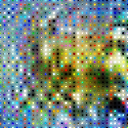

In [27]:
a = render.render_vis(model, "inception3b:404", transforms=[], progress=False,
                     fixed_image_size=32)[0]

In [60]:
a[0].shape

(128, 128, 3)

In [17]:
48/3

16.0

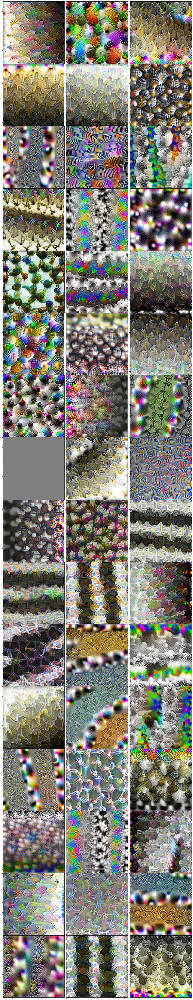

In [20]:
n_row = 16
n_col = 3
_, axs = plt.subplots(n_row, n_col, figsize=(3*5, 16*5))
axs = axs.flatten()
for ix, ax in zip(range(n_row*n_col), axs):
  img = render.render_vis(model, f"inception4a_branch3:{ix}", progress=False, show_image=False)[0]
  #img = np.transpose(img, [0, 3, 2, 1])
  img = np.reshape(img, (128, 128, 3))
  ax.imshow(img)
  ax.set_xticklabels([])
  ax.set_yticklabels([])
    
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

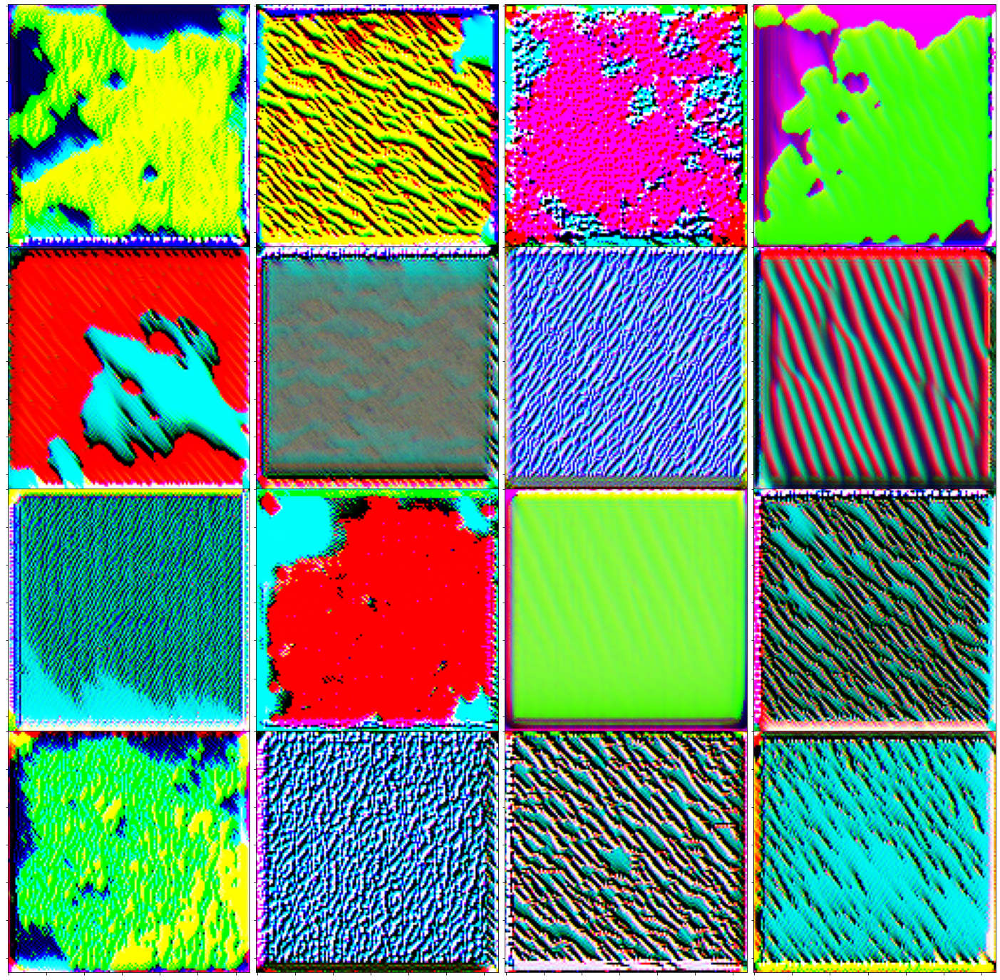

In [87]:
n_row = 4
n_col = 4
_, axs = plt.subplots(n_row, n_col, figsize=(25, 25))
axs = axs.flatten()
for ix, ax in zip(range(16), axs):
    param_f = lambda: param.image(128, fft=True, decorrelate=False)
    img = render.render_vis(net, f"conv2:{ix}", param_f, transforms=[], progress=False, show_image=False)[0]
    #img = np.transpose(img, [0, 3, 2, 1])
    img = np.reshape(img, (128, 128, 3))
    ax.imshow(img)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()